In [ ]:
!pip install --upgrade tensorflow_addons
!pip install --upgrade tensorflow_datasets

     |████████████████████████████████| 686kB 33.5MB/s 
     |████████████████████████████████| 3.9MB 31.0MB/s 
  Found existing installation: tensorflow-datasets 4.0.1
    Uninstalling tensorflow-datasets-4.0.1:
      Successfully uninstalled tensorflow-datasets-4.0.1


In [ ]:
import time

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.layers import (Activation, Concatenate, Conv2D,
                                     Conv2DTranspose, Input, LeakyReLU)
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.layers import InstanceNormalization

import tensorflow_datasets as tfds

%matplotlib inline

In [ ]:
# Load dataset
data, metadata = tfds.load('cycle_gan/monet2photo', with_info=True, as_supervised=True)

train_x, train_y, test_x, test_y = data['trainA'], data['trainB'], data['testA'], data['testB']

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0. Subsequent calls will reuse this data.


In [ ]:
# Settings
epochs = 10

LAMBDA = 10

img_rows, img_cols, channels = 256, 256, 3
weight_initializer = RandomNormal(stddev=0.02)

gen_g_optimizer = gen_f_optimizer = Adam(lr=0.0002, beta_1=0.5)
dis_x_optimizer = dis_y_optimizer = Adam(lr=0.0002, beta_1=0.5)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
# Normalize images to [-1, 1] and reshape
def preprocess_image(image, _):
    return tf.reshape(tf.cast(tf.image.resize(image, (int(img_rows), int(img_cols))), tf.float32) / 127.5 - 1, (1, img_rows, img_cols, channels))

In [ ]:
# Map the normalization onto the dataset
train_x = train_x.map(preprocess_image)
train_y = train_y.map(preprocess_image)
test_x = test_x.map(preprocess_image)
test_y = test_y.map(preprocess_image)

تصویر ورودی با لایه های کانولوشنی به اندازه مشخص 512 می رسد
در نهایت در لایه آخر یک لایه کانولوشن گذاشته شده که خروجی تکی تولید می کند 

In [ ]:
def discriminator():
    dis_input = Input(shape=(img_rows, img_cols, channels))

    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=weight_initializer)(dis_input)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=weight_initializer)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=weight_initializer)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=weight_initializer)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)

    d = Conv2D(1, (4, 4), padding='same', kernel_initializer=weight_initializer)(d)

    return Model(dis_input, d)

برای بخش سازنده از یک حالت رمزگذار - رمزگشا استفاده می شود که ساختار یو نت استفاده می کند.
در بخش رمزگذار تصاویر در لایه های کانولوشنی از سایز 64 به 512 می رسند
در بخش رمزگشا تصاویر دریافتی از بخش رمزگذار با سایز 512 به سایز 64 می رسند
در نهایت با کمک لایه دی کانولوشن خروجی مورد نظر تهیه می شود

In [ ]:
# a 3×3 Convolution and InstanceNorm and ReLU with k filters and stride 2
def dk(k, use_instancenorm=True):
    block = Sequential()
    block.add(Conv2D(k, (3, 3), strides=2, padding='same', kernel_initializer=weight_initializer))
    if use_instancenorm:
        block.add(InstanceNormalization(axis=-1))
    block.add(Activation('relu'))

    return block

# a 3×3 fractional and strided and ConvolutionInstanceNorm and ReLU layer with k filters and stride 0.5"
def uk(k):
    block = Sequential()
    block.add(Conv2DTranspose(k, (3, 3), strides=2, padding='same', kernel_initializer=weight_initializer))
    block.add(InstanceNormalization(axis=-1))
    block.add(Activation('relu'))

    return block

def generator():
    gen_input = Input(shape=(img_rows, img_cols, channels))
    
    # Layers for the encoder part 
    encoder_layers = [
        dk(64, False),
        dk(128),
        dk(256),
        dk(512),
        dk(512),
        dk(512),
        dk(512),
        dk(512)
    ]

    # Layers for the decoder part 
    decoder_layers = [
        uk(512),
        uk(512),
        uk(512),
        uk(512),
        uk(256),
        uk(128),
        uk(64)
    ]

    gen = gen_input

    # Add all the encoder layers
    skips = []
    for layer in encoder_layers:
        gen = layer(gen)
        skips.append(gen)
    
    skips = skips[::-1][1:] 

    # Add all the decoder layers
    for skip_layer, layer in zip(skips, decoder_layers):
        gen = layer(gen)
        gen = Concatenate()([gen, skip_layer])

    
    # Final layer
    gen = Conv2DTranspose(channels, (3, 3), strides=2, padding='same', kernel_initializer=weight_initializer, activation='tanh')(gen)
    

    return Model(gen_input, gen)


In [ ]:
# Define models
generator_g = generator()
generator_f = generator()

discriminator_x = discriminator()
discriminator_y = discriminator()

توابع زیر برای محاسبه تابع هزینه جداکننده و سازنده و همچنین شباهت بین تو تصویر بر اساس قدر مطلق پیکسل های تصاویر محاسبه می شوند

In [ ]:

# Losses
loss = BinaryCrossentropy(from_logits=True)

# Measures how close to one real images are rated, and how close to zero fake images are rated
def discriminator_loss(real, generated):
    # Multiplied by 0.5 so that it will train at half-speed
    return (loss(tf.ones_like(real), real) + loss(tf.zeros_like(generated), generated)) * 0.5

# Measures how real the discriminator believes the fake image is
def gen_loss(validity):
    return loss(tf.ones_like(validity), validity)

# Measures similarity of two images.  Used for cycle and identity loss
def image_similarity(image1, image2):
    return tf.reduce_mean(tf.abs(image1 - image2))

هر گام از عملیات ورود تصاویر و بروز رسانی وزن ها در این تابع انجام می شوند.
با توجه به بخش های مشخص شده مقدار تابع هزینه برای جدا کننده مشخص می شود.
سپس سه نوع تابع هزینه برای سازنده محاسبه می شود و در مجموع مقدار نهایی تابع هزینه برای بخش سازنده به صورت کلی محاسبه شده و عملیات بروزرسانی وزن ها انجام می شود.

In [ ]:
@tf.function
def step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        # Setup Dy loss
        fake_y = generator_g(real_x, training=True)
        gen_g_validity = discriminator_y(fake_y, training=True)
        dis_y_loss = discriminator_loss(discriminator_y(real_y, training=True), gen_g_validity)

        with tape.stop_recording():
            discriminator_y_gradients = tape.gradient(dis_y_loss, discriminator_y.trainable_variables)
            dis_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

        # Setup Dx loss
        fake_x = generator_f(real_y, training=True)
        gen_f_validity = discriminator_x(fake_x, training=True)
        dis_x_loss = discriminator_loss(discriminator_x(real_x, training=True), gen_f_validity)

        with tape.stop_recording():
            discriminator_x_gradients = tape.gradient(dis_x_loss, discriminator_x.trainable_variables)
            dis_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))

        # Setup adversarial losses
        gen_g_adv_loss = gen_loss(gen_g_validity)
        gen_f_adv_loss = gen_loss(gen_f_validity)


        # Setup cycle losses
        cyc_x = generator_f(fake_y, training=True)
        cyc_x_loss = image_similarity(real_x, cyc_x)

        cyc_y = generator_g(fake_x, training=True)
        cyc_y_loss =  image_similarity(real_y, cyc_y)

        # Setup identity losses
        id_x = generator_f(real_x, training=True)
        id_x_loss = image_similarity(real_x, id_x)

        id_y = generator_g(real_y, training=True)
        id_y_loss = image_similarity(real_y, id_y)

        # Finalize generator losses and calc gradients
        gen_g_loss = gen_g_adv_loss + (cyc_x_loss + cyc_y_loss) * LAMBDA + id_y_loss * 0.5*LAMBDA
        gen_f_loss = gen_f_adv_loss + (cyc_x_loss + cyc_y_loss) * LAMBDA + id_x_loss * 0.5*LAMBDA

        with tape.stop_recording():
            generator_g_gradients = tape.gradient(gen_g_loss, generator_g.trainable_variables)
            gen_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))

            generator_f_gradients = tape.gradient(gen_f_loss, generator_f.trainable_variables)
            gen_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
        return dis_y_loss,dis_x_loss,gen_g_adv_loss,gen_f_adv_loss,cyc_y_loss,cyc_x_loss,id_y_loss,id_x_loss


In [ ]:
def generate_images():
    # Sample images
    x = next(iter(test_x.shuffle(1000))).numpy()
    y = next(iter(test_y.shuffle(1000))).numpy()
    
    # Get predictions for those images
    y_hat = generator_g.predict(x.reshape((1, img_rows, img_cols, channels)))
    x_hat = generator_f.predict(y.reshape((1, img_rows, img_cols, channels)))
    
    plt.figure(figsize=(12, 12))

    images = [x[0], y_hat[0], y[0], x_hat[0]]

    for i in range(4):
        plt.subplot(2, 2, i+1)
        plt.imshow(images[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

عملیات آموزش مدل با تعداد ایپاک های مشخص شده در این حلقه انجام می شود

Epoch: 0


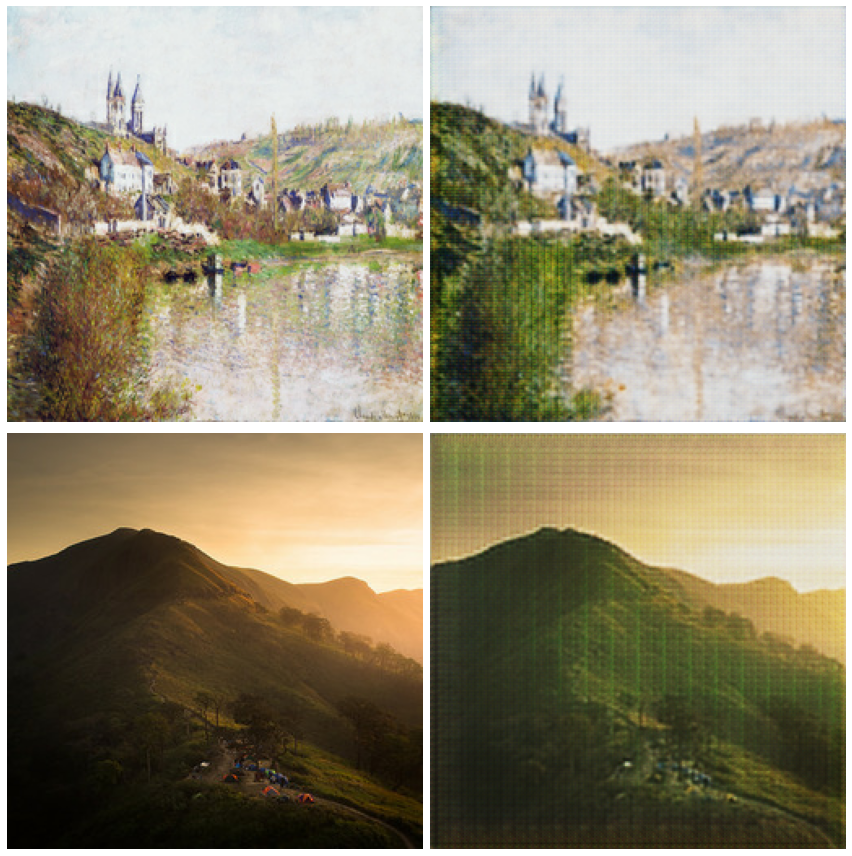

Time taken: 309.9565851688385
Epoch: 1


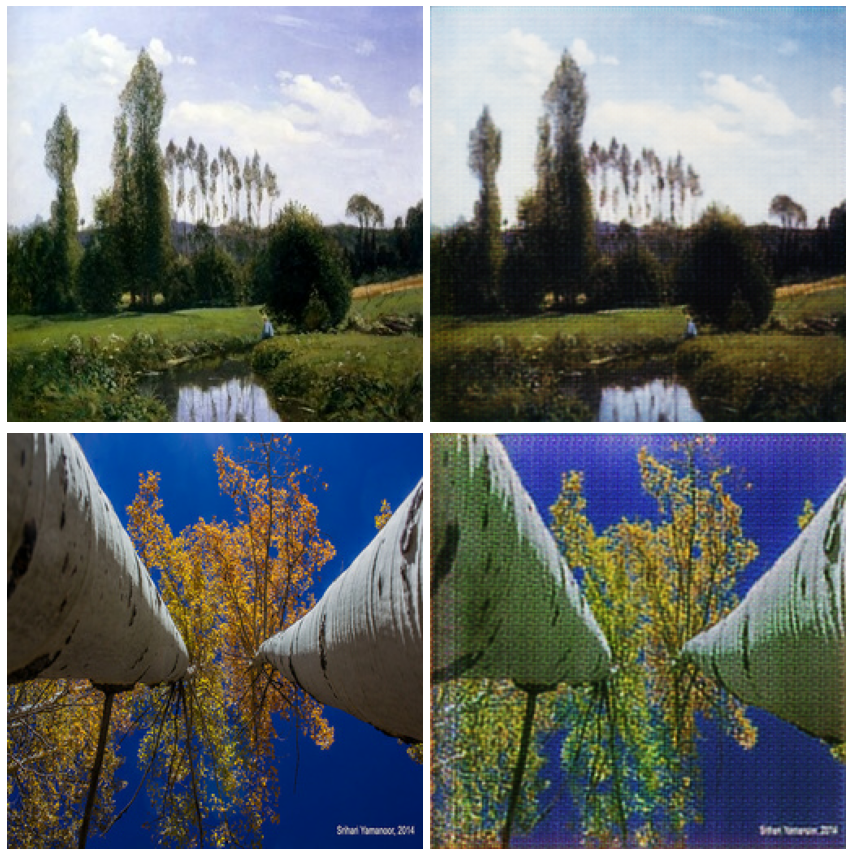

Time taken: 258.23205494880676
Epoch: 2


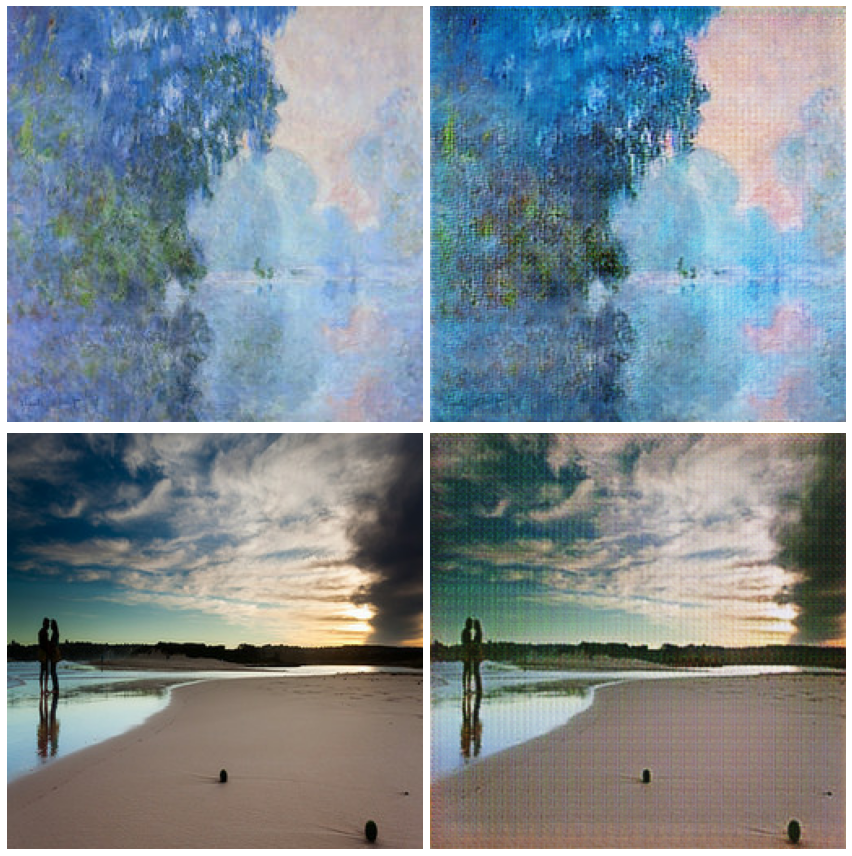

Time taken: 258.5766258239746
Epoch: 3


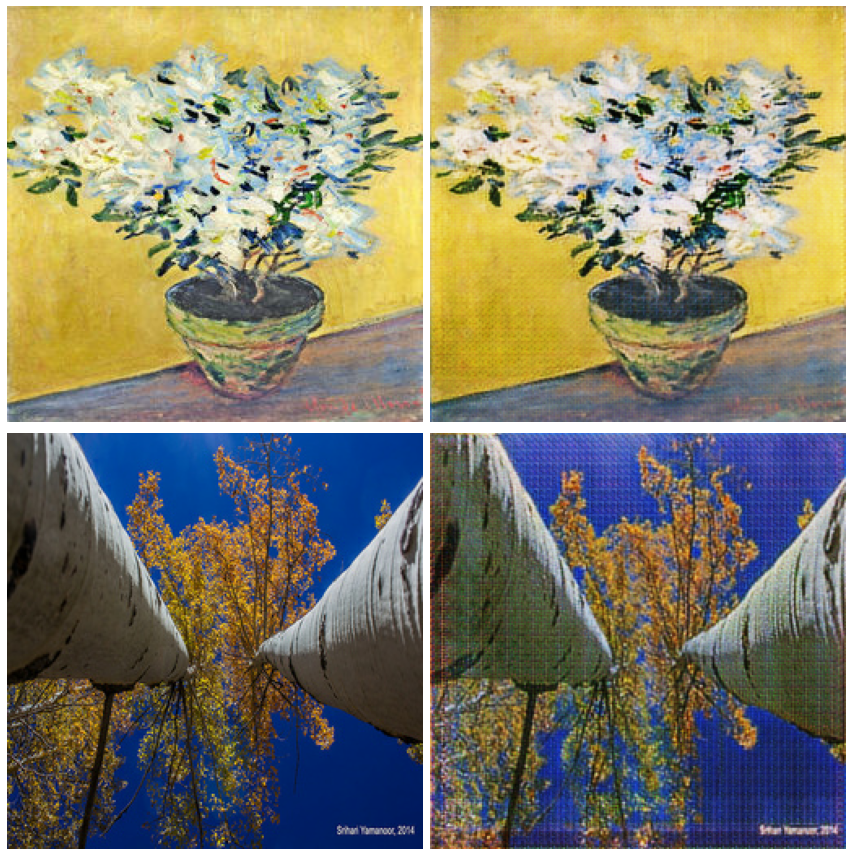

Time taken: 256.1688334941864
Epoch: 4


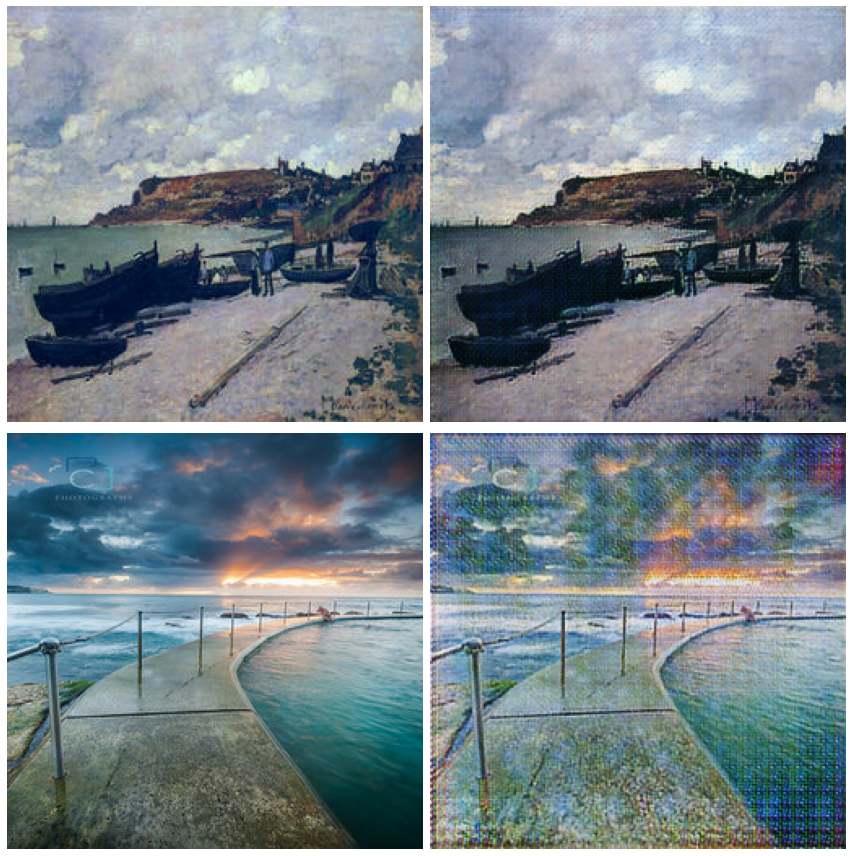

Time taken: 255.8650918006897
Epoch: 5


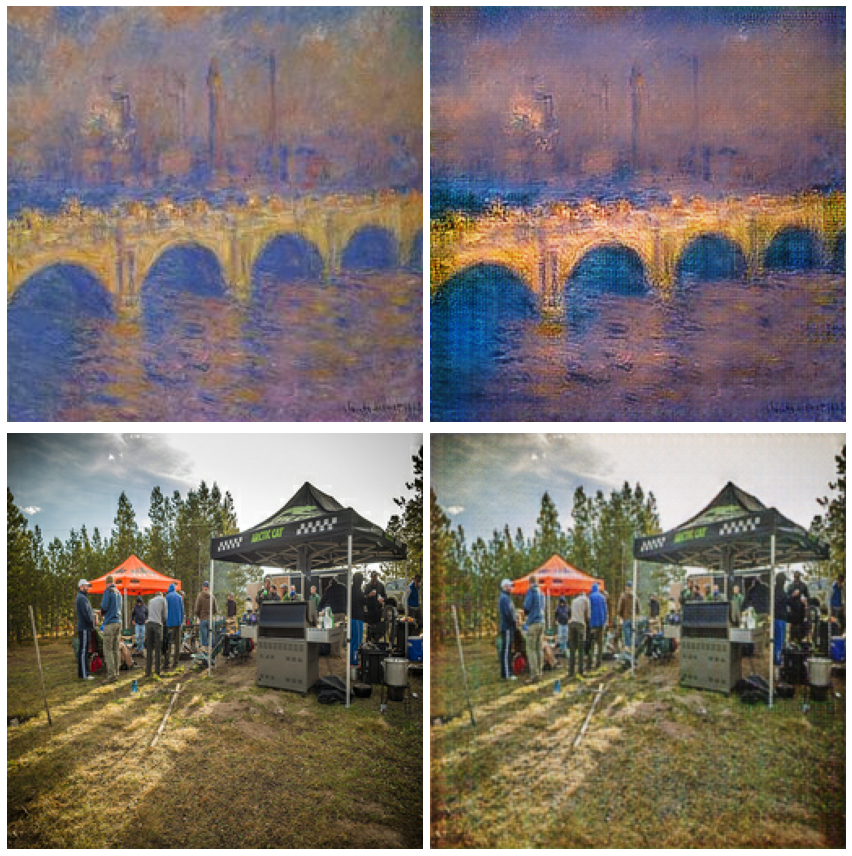

Time taken: 255.8049144744873
Epoch: 6


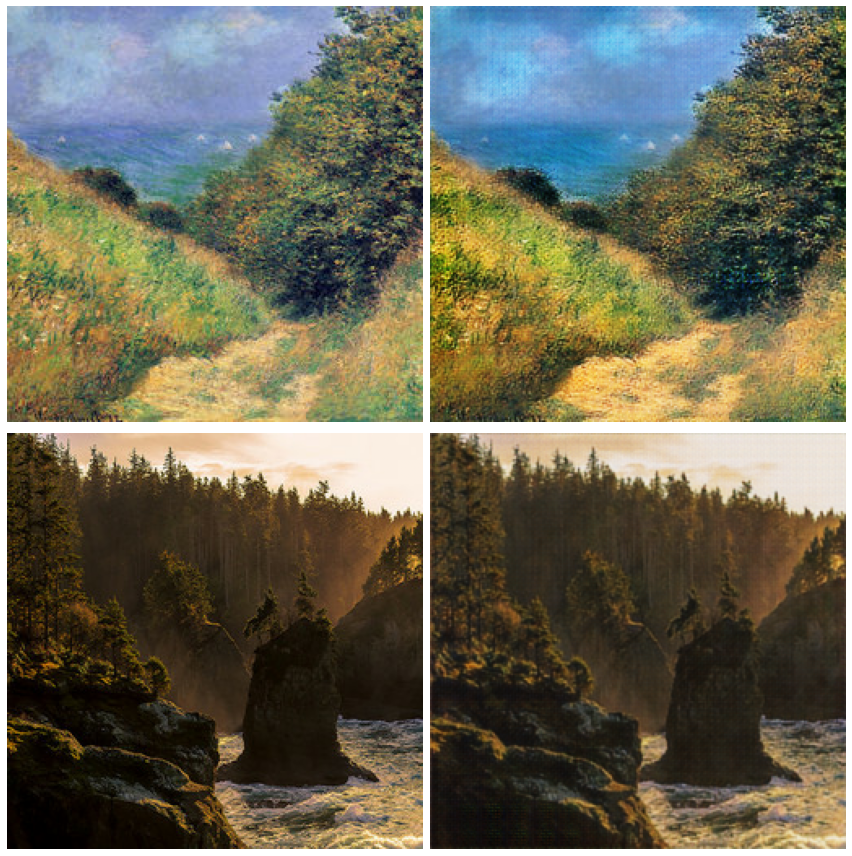

Time taken: 255.89250421524048
Epoch: 7


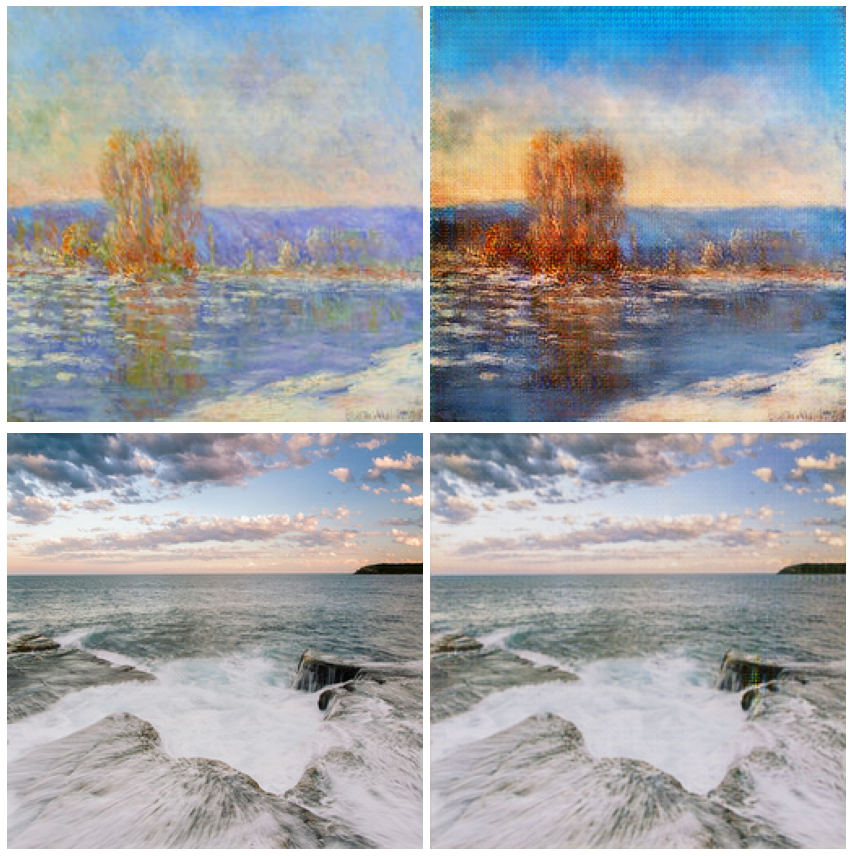

Time taken: 256.79064750671387
Epoch: 8


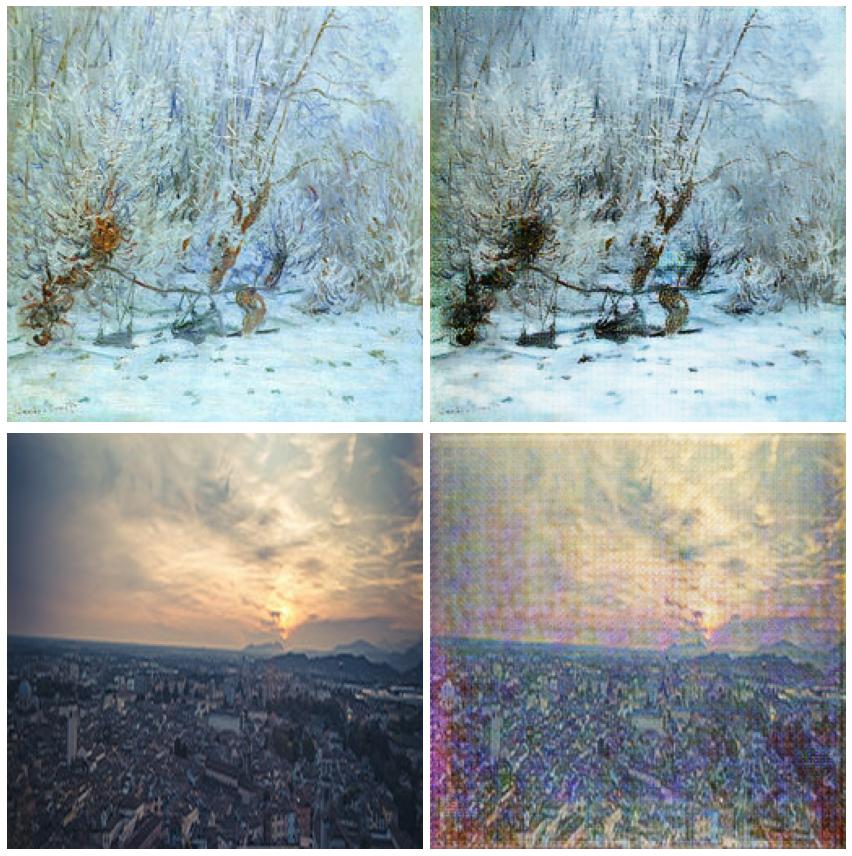

Time taken: 258.15031576156616
Epoch: 9


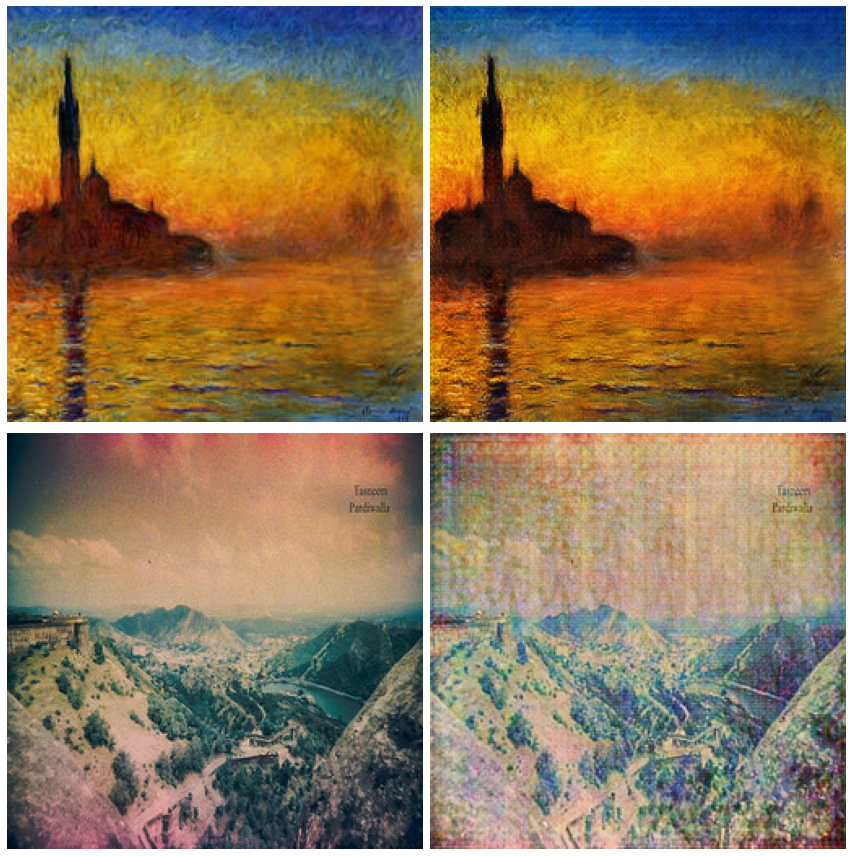

Time taken: 258.10823035240173


In [ ]:
# Manually loop through epochs
loss_diss_y = []
loss_diss_x = []
loss_adv_gen_y = []
loss_adv_gen_x = []

loss_cyc_gen_y = []
loss_cyc_gen_x = []

loss_id_gen_y = []
loss_id_gen_x = []

for epoch in range(epochs):
    print('Epoch: {}'.format(epoch))
    start = time.time()
    ld_y = []
    ld_x = []

    l_adv_gen_y = []
    l_adv_gen_x = []

    l_cyc_gen_y = []
    l_cyc_gen_x = []

    l_id_gen_y = []
    l_id_gen_x = []

    # Each batch
    for k, (real_x, real_y) in enumerate(tf.data.Dataset.zip((train_x, train_y))):
        # Train step
        diss_y,diss_x,avd_gen_y,avd_gen_x,cyc_gen_y,cyc_gen_x,id_gen_y,id_gen_x = step(tf.reshape(real_x, (1, img_rows, img_cols, channels)), tf.reshape(real_y, (1, img_rows, img_cols, channels)))
        
        ld_y.append(diss_y.numpy())
        ld_x.append(diss_x.numpy())

        l_adv_gen_y.append(avd_gen_y.numpy())
        l_adv_gen_x.append(avd_gen_x.numpy())

        l_cyc_gen_y.append(cyc_gen_y.numpy())
        l_cyc_gen_x.append(cyc_gen_x.numpy())

        l_id_gen_y.append(id_gen_y.numpy())
        l_id_gen_x.append(id_gen_x.numpy())
    

    loss_diss_y.append(sum(ld_y)/len(ld_y))
    loss_diss_x.append(sum(ld_x)/len(ld_x))

    loss_adv_gen_y.append(sum(l_adv_gen_y)/len(l_adv_gen_y))
    loss_adv_gen_x.append(sum(l_adv_gen_x)/len(l_adv_gen_x))

    loss_cyc_gen_y.append(sum(l_cyc_gen_y)/len(l_cyc_gen_y))
    loss_cyc_gen_x.append(sum(l_cyc_gen_x)/len(l_cyc_gen_x))

    loss_id_gen_y.append(sum(l_id_gen_y)/len(l_id_gen_y))
    loss_id_gen_x.append(sum(l_id_gen_x)/len(l_id_gen_x))
      
    # View progress
    generate_images()
    print('Time taken: {}'.format(time.time() - start))

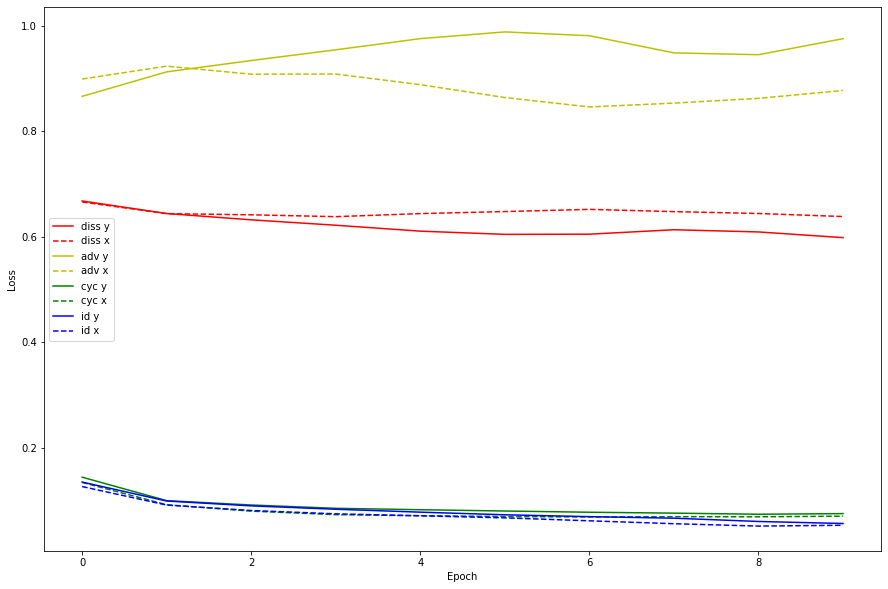

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(loss_diss_y,"r")
plt.plot(loss_diss_x,"r--")

plt.plot(loss_adv_gen_y,"y")
plt.plot(loss_adv_gen_x,"y--")

plt.plot(loss_cyc_gen_y,"g")
plt.plot(loss_cyc_gen_x,"g--")

plt.plot(loss_id_gen_y,"b")
plt.plot(loss_id_gen_x,"b--")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend(["diss y","diss x","adv y","adv x","cyc y","cyc x","id y","id x"])
plt.show()